In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm

import glob
import cv2
import os

from colorama import Fore, Back, Style

# Setting color palette.
plt.rcdefaults()
plt.style.use('dark_background')

import warnings
warnings.filterwarnings("ignore")

In [38]:
# Assigning paths to variables
INPUT_PATH = os.path.join('e:/datasets')
DATASET_PATH = os.path.join(INPUT_PATH, 'landmark-recognition-2020')
TRAIN_IMAGE_PATH = os.path.join(DATASET_PATH, 'train')
TEST_IMAGE_PATH = os.path.join(DATASET_PATH, 'test')
TRAIN_CSV_PATH = os.path.join(DATASET_PATH, 'train.csv')
SUBMISSION_CSV_PATH = os.path.join(DATASET_PATH, 'sample_submission.csv')

In [39]:
train = pd.read_csv(TRAIN_CSV_PATH)
print("training dataset has {} rows and {} columns".format(train.shape[0],train.shape[1]))

submission = pd.read_csv(SUBMISSION_CSV_PATH)
print("submission dataset has {} rows and {} columns \n".format(submission.shape[0],submission.shape[1]))

training dataset has 1580470 rows and 2 columns
submission dataset has 10345 rows and 2 columns 



FOLDER STRUCTURE
We have Training Data saved in folder ranging `0 to f`, We will see one example below to understand the folder structure

In [40]:
# understand folder structure
print(Fore.YELLOW + "If you want to access image a40d00dc4fcc3a10, you should traverse as shown below:\n",Style.RESET_ALL)

print(Fore.GREEN + f"Image name: {train['id'].iloc[9]}\n",Style.RESET_ALL)

print(Fore.BLUE + f"First folder to look inside: {train['id'][9][0]}")
print(Fore.BLUE + f"Second folder to look inside: {train['id'][9][1]}")
print(Fore.BLUE + f"Second folder to look inside: {train['id'][9][2]}",Style.RESET_ALL)

If you want to access image a40d00dc4fcc3a10, you should traverse as shown below:
 
Image name: a40d00dc4fcc3a10
 
First folder to look inside: a
Second folder to look inside: 4
Second folder to look inside: 0 


Build dictionary to store image paths & labels

In [41]:
print(Fore.BLUE + f"{'---'*20} \n Mapping for Training Data \n {'---'*20}")
data_label_dict = {'image': [], 'target': []}
for i in tqdm(range(train.shape[0])):
    data_label_dict['image'].append(
        TRAIN_IMAGE_PATH + '/' +
        train['id'][i][0] + '/' + 
        train['id'][i][1]+ '/' +
        train['id'][i][2]+ '/' +
        train['id'][i] + ".jpg")
    data_label_dict['target'].append(
        train['landmark_id'][i])

#Convert to dataframe
train_pathlabel = pd.DataFrame(data_label_dict)
print(train_pathlabel.head())
    
print(Fore.BLUE + f"{'---'*20} \n Mapping for Test Data \n {'---'*20}",Style.RESET_ALL)
data_label_dict = {'image': []}
for i in tqdm(range(submission.shape[0])):
    data_label_dict['image'].append(
        TEST_IMAGE_PATH + '/' +
        submission['id'][i][0] + '/' + 
        submission['id'][i][1]+ '/' +
        submission['id'][i][2]+ '/' +
        submission['id'][i] + ".jpg")

test_pathlabel = pd.DataFrame(data_label_dict)
print(test_pathlabel.head())

------------------------------------------------------------ 
 Mapping for Training Data 
 ------------------------------------------------------------


100%|██████████| 1580470/1580470 [00:30<00:00, 51849.83it/s]


                                               image  target
0  e:/datasets\landmark-recognition-2020\train/1/...       1
1  e:/datasets\landmark-recognition-2020\train/9/...       1
2  e:/datasets\landmark-recognition-2020\train/c/...       1
3  e:/datasets\landmark-recognition-2020\train/f/...       1
4  e:/datasets\landmark-recognition-2020\train/2/...       7
------------------------------------------------------------ 
 Mapping for Test Data 
 ------------------------------------------------------------ 


100%|██████████| 10345/10345 [00:00<00:00, 67352.88it/s]

                                               image
0  e:/datasets\landmark-recognition-2020\test/0/0...
1  e:/datasets\landmark-recognition-2020\test/0/0...
2  e:/datasets\landmark-recognition-2020\test/0/0...
3  e:/datasets\landmark-recognition-2020\test/0/0...
4  e:/datasets\landmark-recognition-2020\test/0/0...


In [42]:
# list of unique landmark ids
train.landmark_id.unique()

array([     1,      7,      9, ..., 203087, 203091, 203092], dtype=int64)

In [43]:
# count of unique landmark_ids
print("There are", train.landmark_id.nunique(), "landmarks in the training dataset")

There are 81313 landmarks in the training dataset


In [44]:
# each class count-wise
train.landmark_id.value_counts()

138982    6272
126637    2231
20409     1758
83144     1741
113209    1135
          ... 
84677        2
36989        2
133688       2
17316        2
111405       2
Name: landmark_id, Length: 81313, dtype: int64

Check image Sizes of first 10 images

In [45]:
files = train_pathlabel.image[:10]
print(Fore.BLUE + "Shape of files from training dataset",Style.RESET_ALL)
for i in range(10):
    im = cv2.imread(files[i])
    print(im.shape)


print("------------------------------------")    
print("------------------------------------")    
print("------------------------------------")    

files = test_pathlabel.image[:10]
print(Fore.BLUE + "Shape of files from test dataset",Style.RESET_ALL)
for i in range(10):
    im = cv2.imread(files[i])
    print(im.shape)

Shape of files from training dataset 
(800, 533, 3)
(800, 534, 3)
(512, 800, 3)
(800, 532, 3)
(600, 800, 3)
(534, 800, 3)
(534, 800, 3)
(533, 800, 3)
(534, 800, 3)
(534, 800, 3)
------------------------------------
------------------------------------
------------------------------------
Shape of files from test dataset 
(450, 800, 3)
(473, 333, 3)
(533, 800, 3)
(450, 800, 3)
(534, 800, 3)
(531, 800, 3)
(351, 160, 3)
(425, 290, 3)
(537, 799, 3)
(800, 450, 3)


##Class Distribution Analysis
###Density plot for class distribution

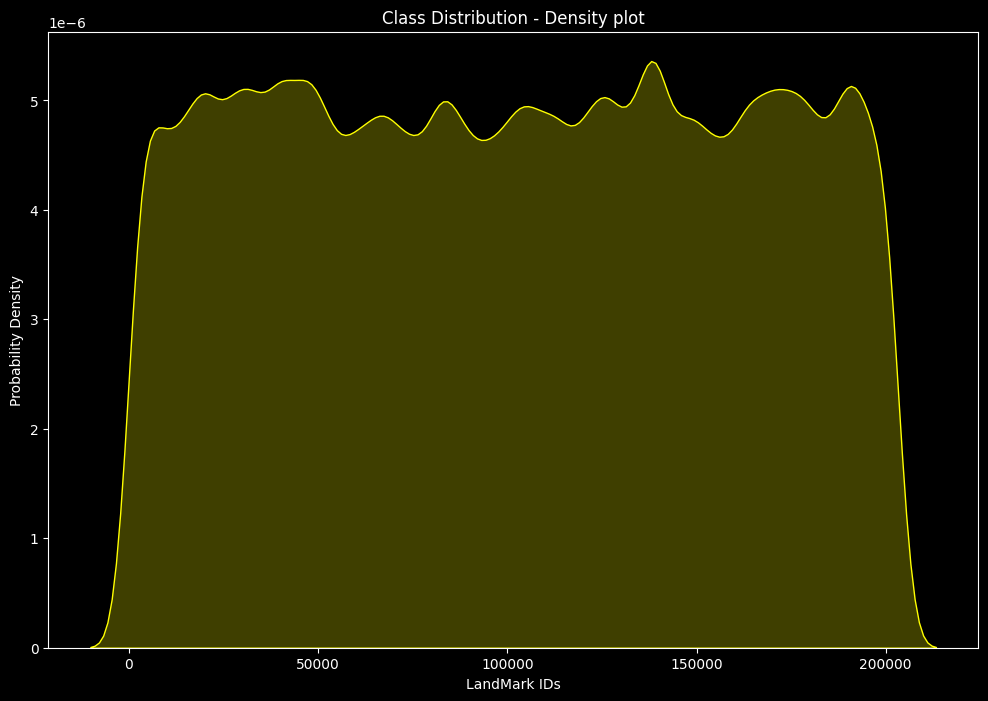

In [46]:
plt.figure(figsize = (12, 8))

sns.kdeplot(train['landmark_id'], color="yellow",shade=True)
plt.xlabel("LandMark IDs")
plt.ylabel("Probability Density")
plt.title('Class Distribution - Density plot')

plt.show()

Top 10 Class Categories

fig = plt.figure(figsize = (12,8))

count = train.landmark_id.value_counts().sort_values(ascending=False)[:10]

sns.countplot(x=train.landmark_id,
             order = train.landmark_id.value_counts().sort_values(ascending=False).iloc[:10].index)

plt.xlabel("LandMark Id")
plt.ylabel("Frequency")
plt.title("Top 10 Classes in the Dataset")

plt.show()

Let's check out images from the top 10 classes

IndexError: index 3 is out of bounds for axis 0 with size 3

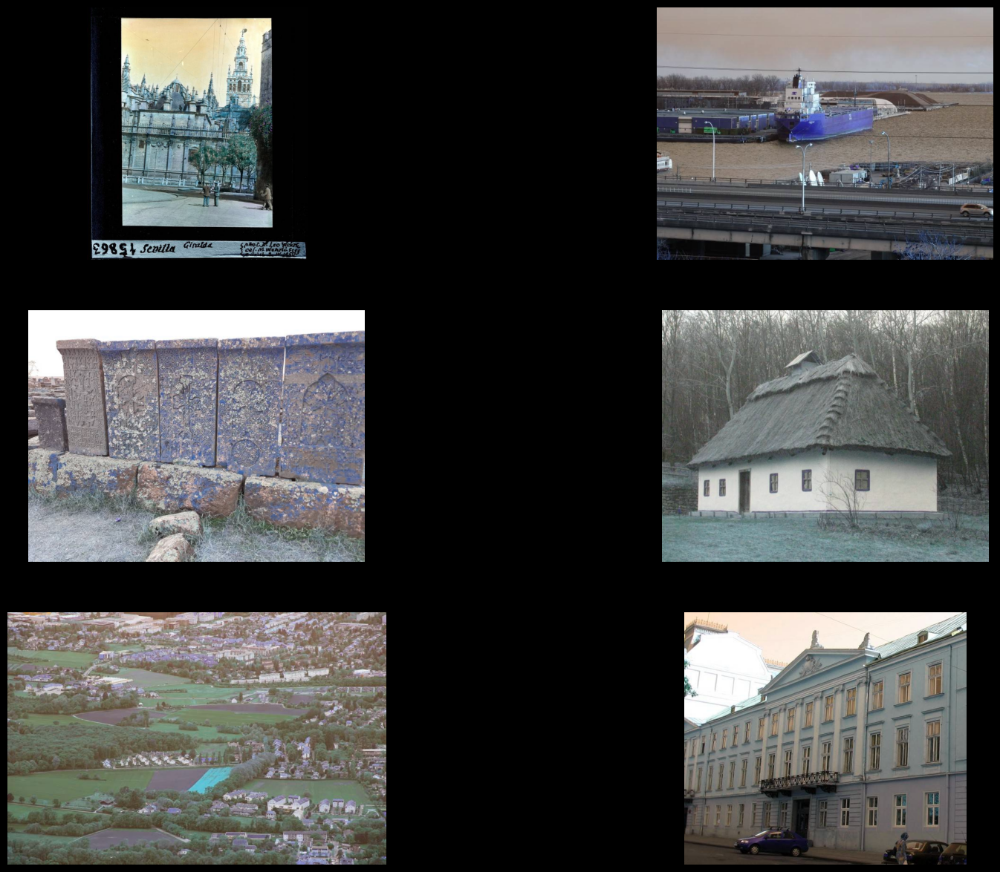

In [47]:
top10 = train.landmark_id.value_counts().sort_values(ascending=False)[:10].index

images = []

for i in range(10):
    img=cv2.imread(train_pathlabel[train_pathlabel.target == top10[i]]['image'].values[1])   
    images.append(img)

f, ax = plt.subplots(3,2, figsize=(20,15))
for i, img in enumerate(images):        
        ax[i//2, i%2].imshow(img)
        ax[i//2, i%2].axis('off')

Top 50 Class Categories

Exception ignored in: <function tqdm.__del__ at 0x000002068D6740D0>
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\Programs\Python\Python38\lib\site-packages\tqdm\std.py", line 1147, in __del__
    self.close()
  File "C:\Users\User\AppData\Local\Programs\Python\Python38\lib\site-packages\tqdm\notebook.py", line 286, in close
    self.disp(bar_style='danger', check_delay=False)
AttributeError: 'tqdm_notebook' object has no attribute 'disp'


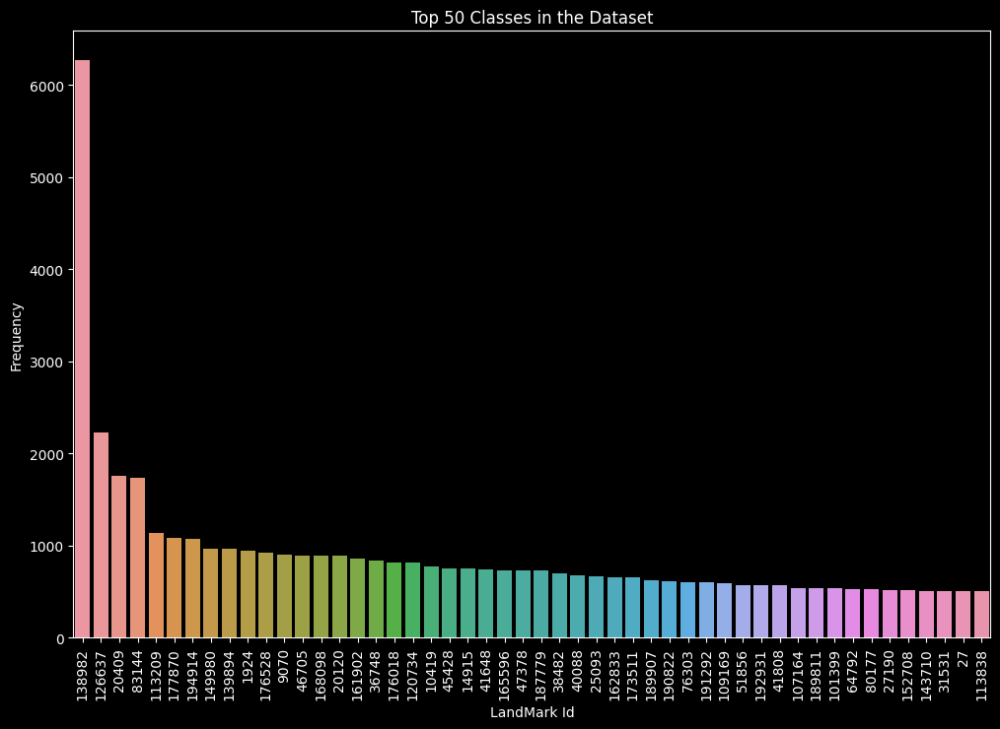

In [48]:
fig = plt.figure(figsize = (12,8))

count = train.landmark_id.value_counts().sort_values(ascending=False)[:50]

sns.countplot(x=train.landmark_id,
             order = train.landmark_id.value_counts().sort_values(ascending=False).iloc[:50].index)

plt.xticks(rotation = 90)

plt.xlabel("LandMark Id")
plt.ylabel("Frequency")
plt.title("Top 50 Classes in the Dataset")

plt.show()

Landmark id '138982' has more than 6000 images. * Next Top 5 clasess in this table has less than 2500 images * Rest of the classes has less than 1000 samples in the training dataset

Let's check out images from the top 50 classes

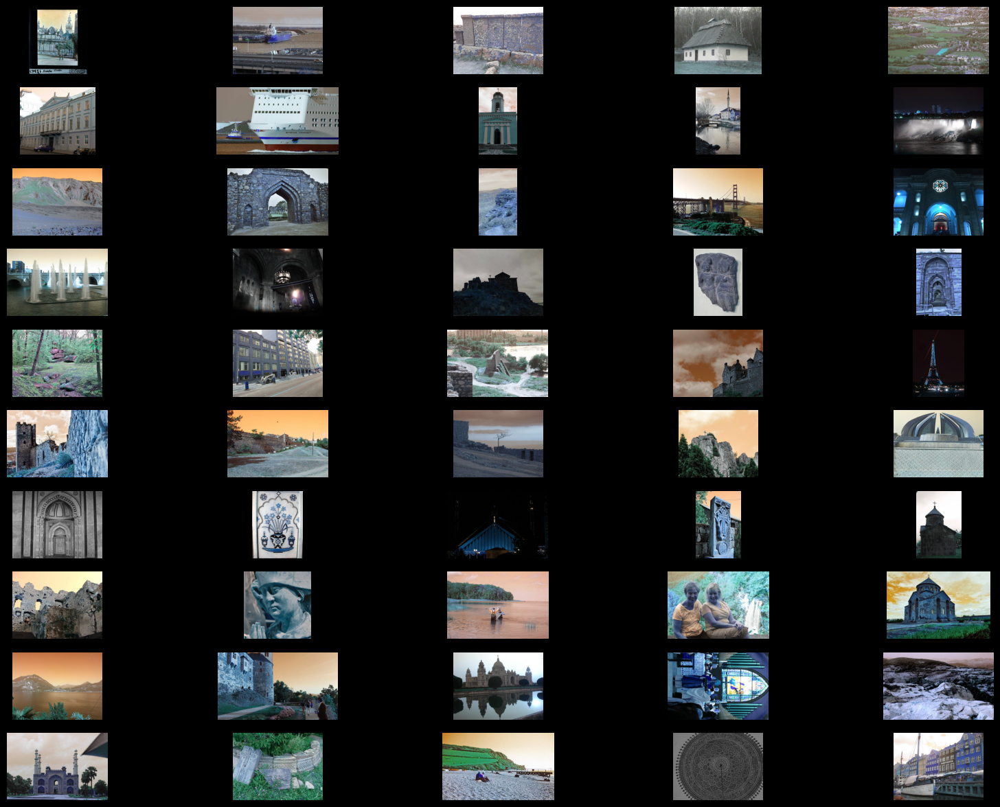

In [49]:
top50 = train.landmark_id.value_counts().sort_values(ascending=False).index[:50]

images = []

for i in range(50):
    img=cv2.imread(train_pathlabel[train_pathlabel.target == top50[i]]['image'].values[1])   
    images.append(img)

f, ax = plt.subplots(10,5, figsize=(20,15))
for i, img in enumerate(images):        
        ax[i//5, i%5].imshow(img)
        ax[i//5, i%5].axis('off')

Bottom 10 classes

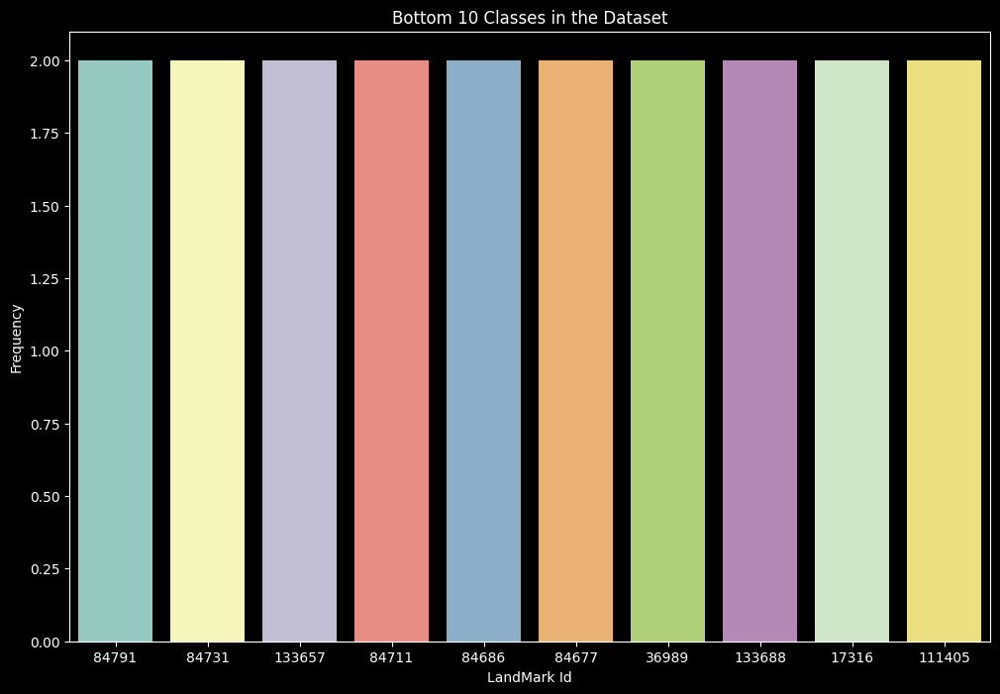

In [50]:
fig = plt.figure(figsize = (12,8))

count = train.landmark_id.value_counts()[-10:]

sns.countplot(x=train.landmark_id,
             order = train_pathlabel.target.value_counts().iloc[-10:].index)

plt.xlabel("LandMark Id")
plt.ylabel("Frequency")
plt.title("Bottom 10 Classes in the Dataset")

plt.show()

Just a few images per class for the bottom 10 classes

Let's check out images from the bottom 10 classes

bottom10 = train.landmark_id.value_counts()[-10:].index

images = []

for i in range(10):
    img=cv2.imread(train_pathlabel[train_pathlabel.target == bottom6[i]]['image'].values[1])   
    images.append(img)

f, ax = plt.subplots(3,2, figsize=(20,15))
for i, img in enumerate(images):        
        ax[i//2, i%2].imshow(img)
        ax[i//2, i%2].axis('off')

Observations from the whole analysis done above: 
* There are 81313 unique landmark_ids 
* There is only one landmark which has more than 6000 images 
* Number of images per landmark_id ranges from 2 to 6272.

We will now check a few images from the top 5 classes

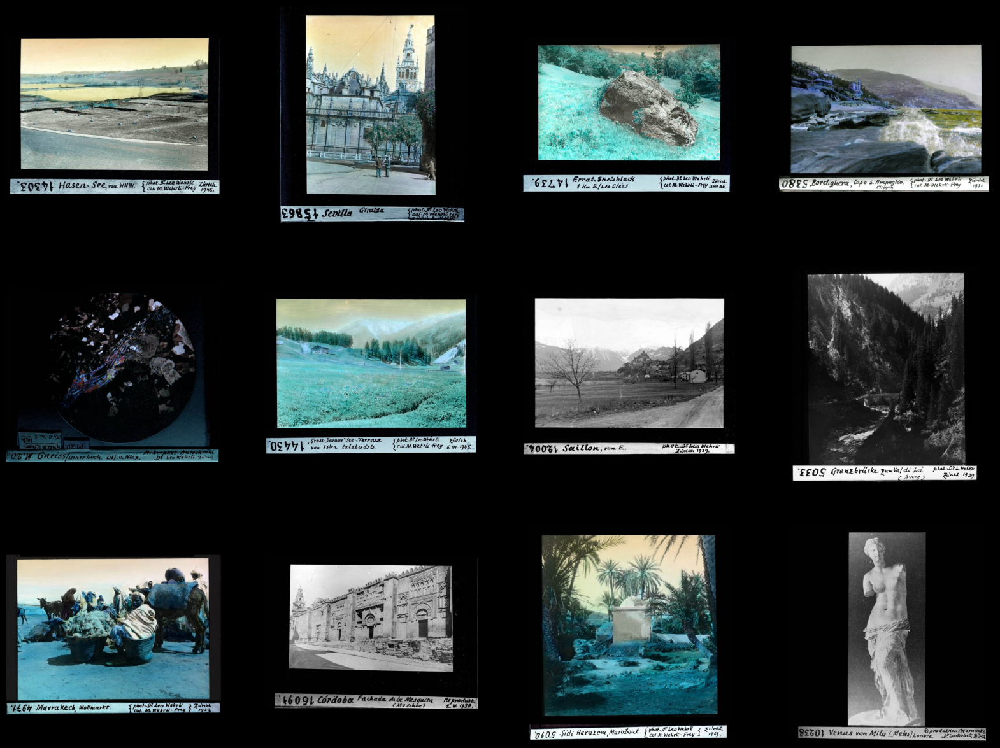

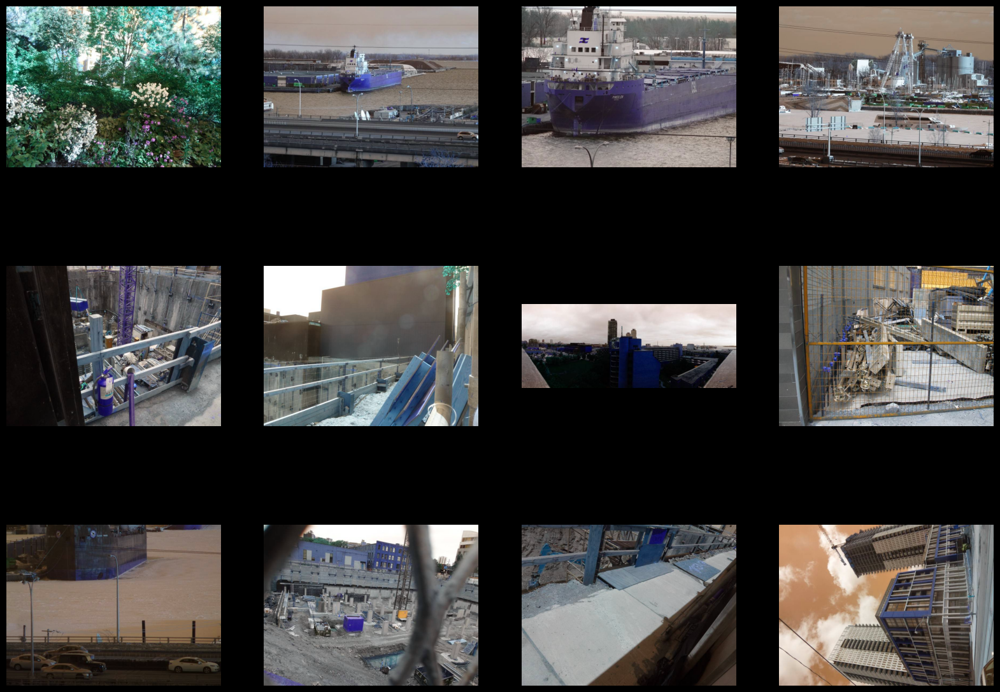

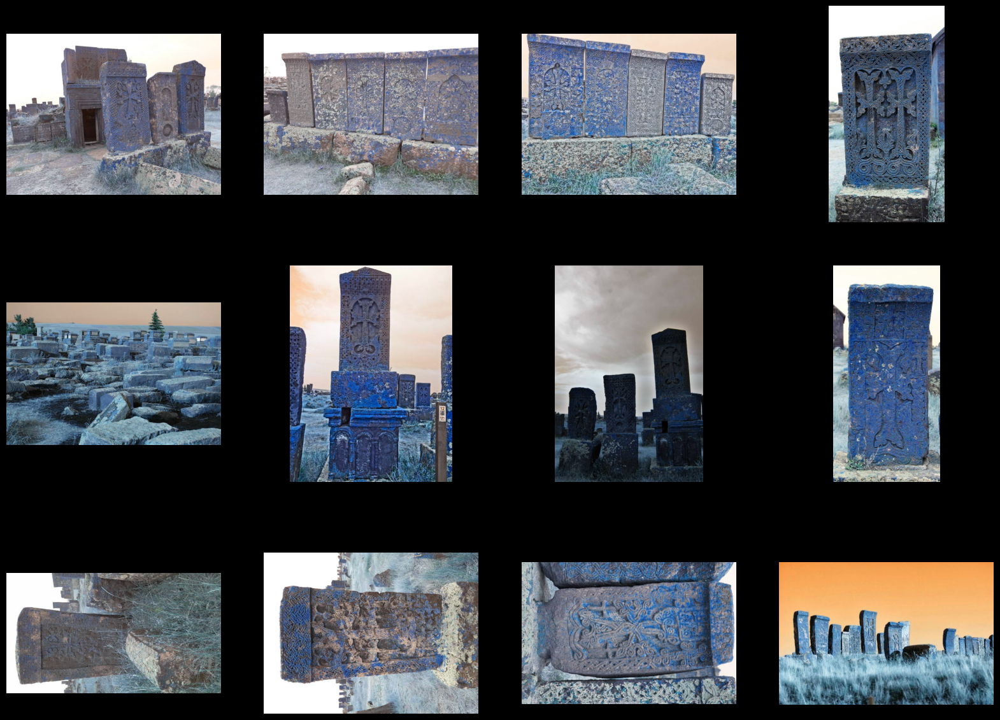

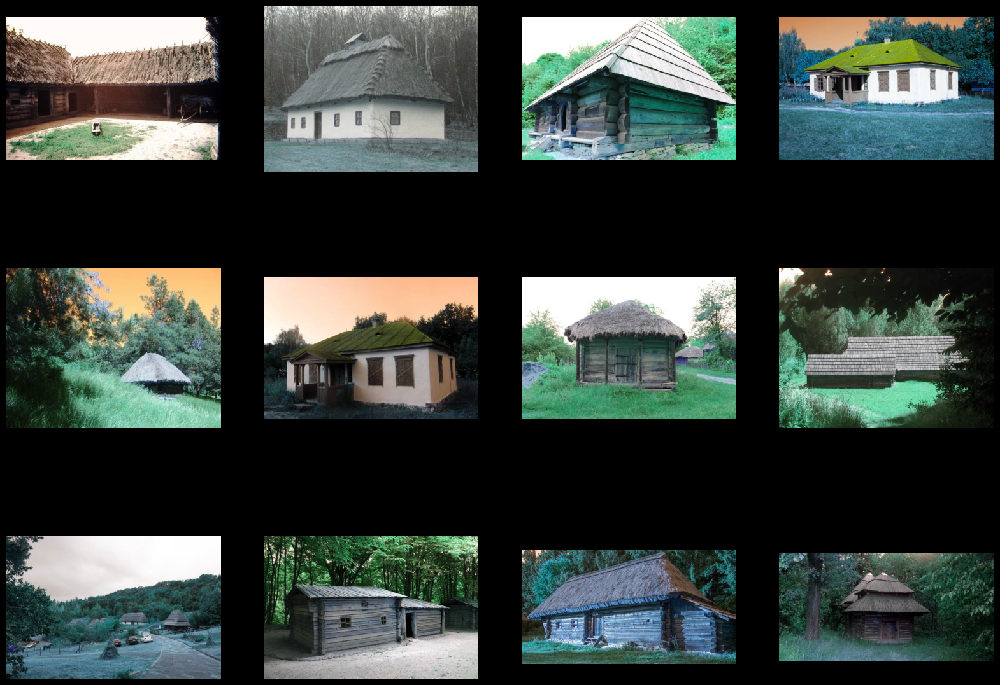

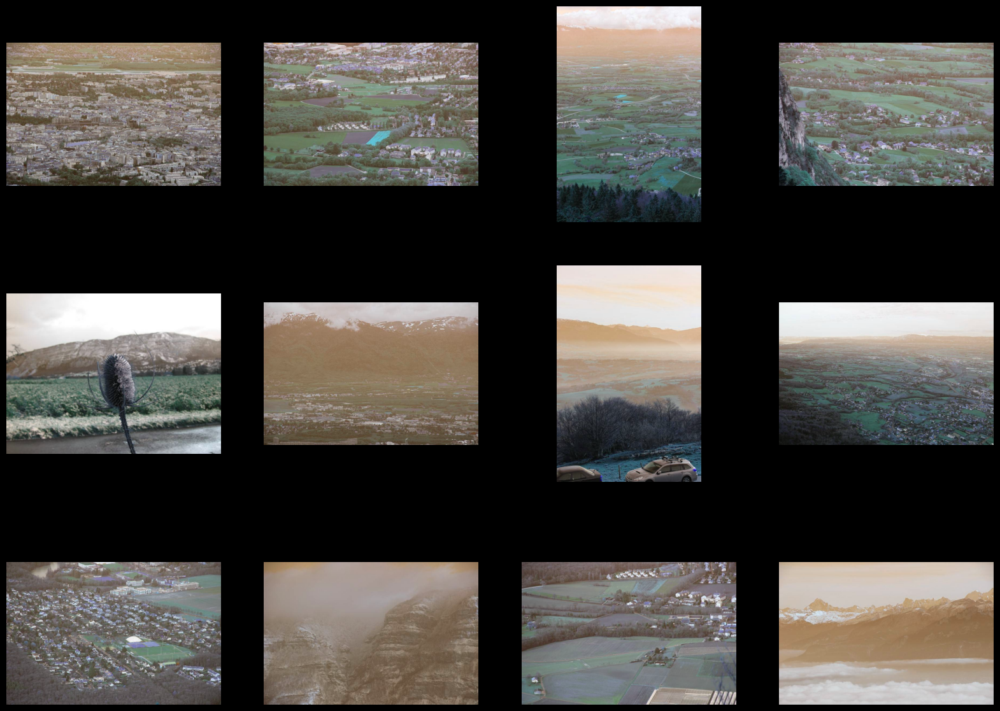

In [51]:
top5 = train.landmark_id.value_counts().sort_values(ascending=False).index[:5]
for i in range(5):
    images = []      
    for j in range(12):
        img=cv2.imread(train_pathlabel[train_pathlabel.target == top5[i]]['image'].values[j])   
        images.append(img)           
    f, ax = plt.subplots(3,4,figsize=(20,15))
    for k, img in enumerate(images):        
        ax[k//4, k%4].imshow(img)
        ax[k//4, k%4].axis('off')
plt.show()

##Histogram of images from training dataset

1. Grayscale Image
* We will loaded the grayscale images here & generated its histogram

* Since the images are stored in the form of a 2D ordered matrix we converted it to a 1D array using the ravel() method

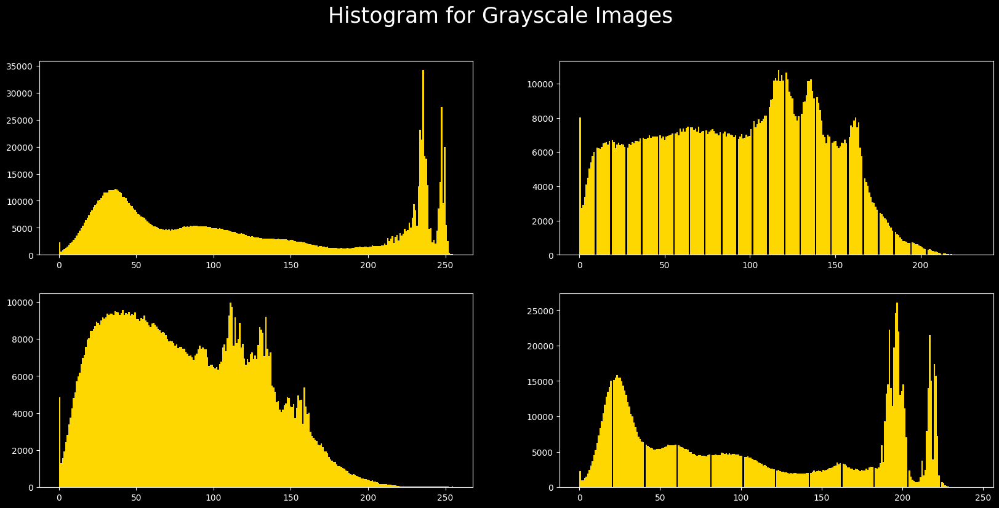

In [53]:
files = train_pathlabel.image[:4]

fig = plt.figure(figsize = (20,9))

for i in range(4):
    img=cv2.imread(files[i])   
    plt.subplot(2,2,i+1)
    plt.hist(img.ravel(), bins = 256,color = 'gold')
    
plt.suptitle("Histogram for Grayscale Images",fontsize = 25)    
plt.show()

2. Cumulative histogram¶

The cumulative histogram is a special histogram that can be derived from the normal histogram.

We find the counts of each intensity value from 0–255 and then add each subsequent counts

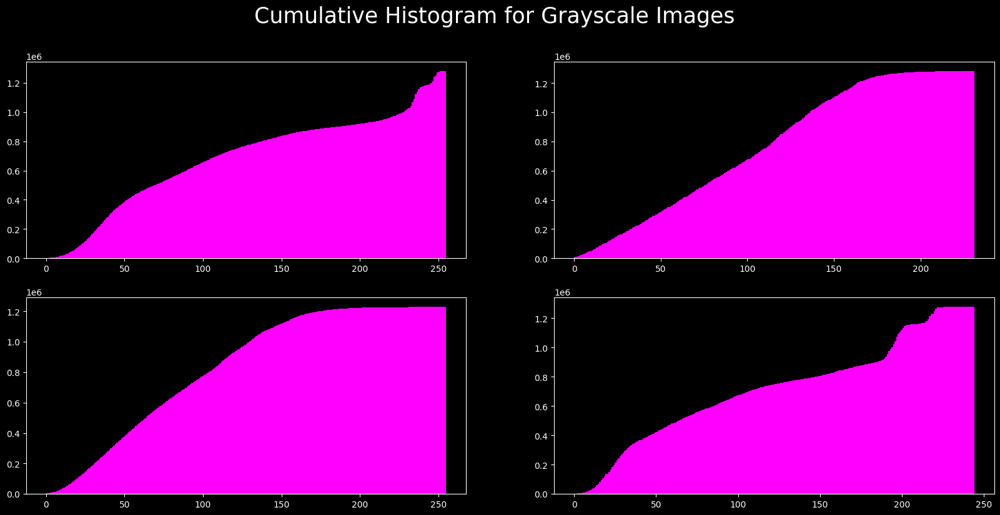

In [54]:
fig = plt.figure(figsize = (20,9))

for i in range(4):
    img=cv2.imread(files[i])   
    plt.subplot(2,2,i+1)
    plt.hist(img.ravel(), bins = 256,color = 'magenta',cumulative = True)

plt.suptitle("Cumulative Histogram for Grayscale Images",fontsize = 25)    
plt.show()

3. Grayscale Image - With bins = 8

Usually, the range of intensity values of images is from [0–255] in 8bits representation(2⁸).

But images can be also represented using 2¹⁶, 2³² bits and so on. In such cases the intensity range is high and it is hard to represent each intensity value in a histogram.

We use binning to overcome the above problem. Here we quantize the range into several buckets. For example,

If we quantize 0-255 into 8 bins, here our bins will be: 0-31, 32-63, 64-95, 96-127, 128-159, 160-191, 192-223, 224-255

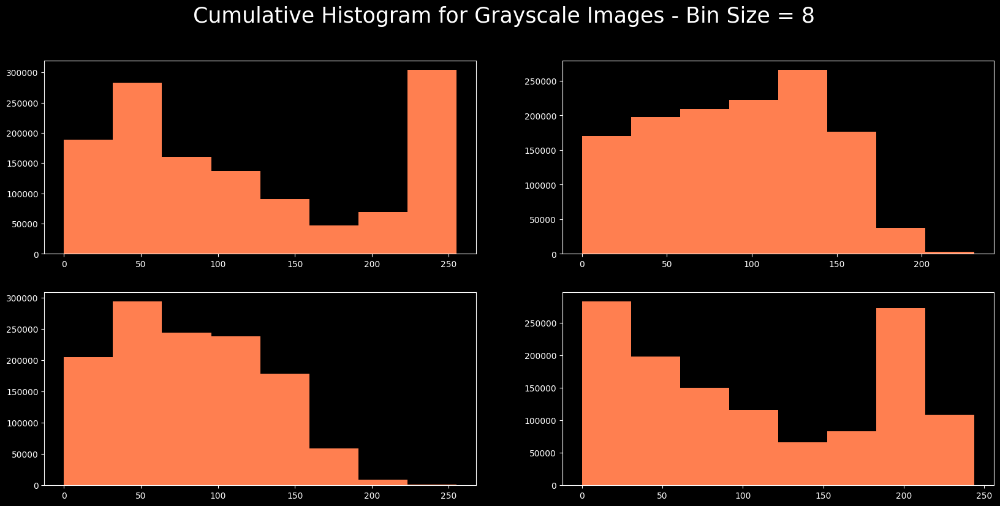

In [55]:
fig = plt.figure(figsize = (20,9))

for i in range(4):
    img=cv2.imread(files[i])   
    plt.subplot(2,2,i+1)
    plt.hist(img.ravel(), bins = 8, color = "coral")

plt.suptitle("Cumulative Histogram for Grayscale Images - Bin Size = 8",fontsize = 25)    
plt.show()

4. Color Image

* In color images, we have 3 color channels representing RGB. In Combined Color Histogram the intensity count is the sum of all three color channels

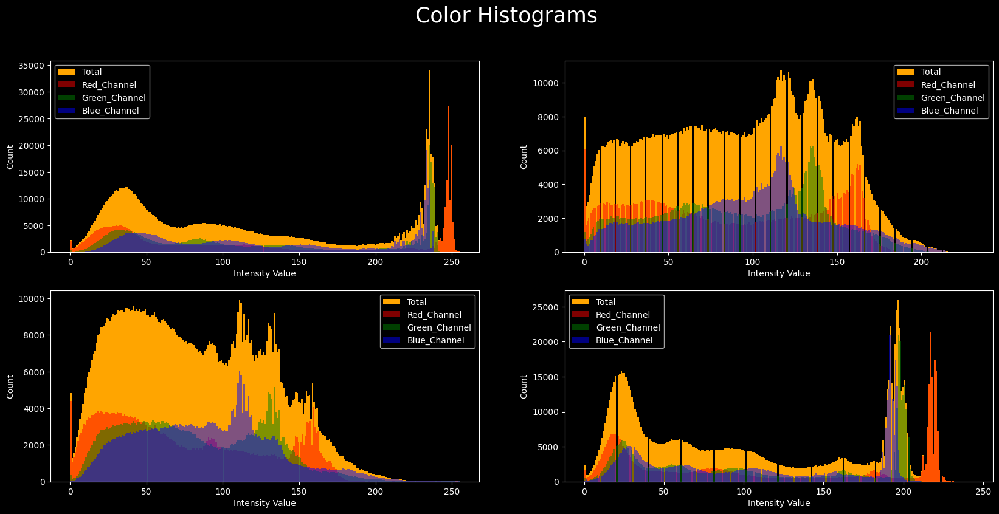

In [56]:
fig = plt.figure(figsize = (20,9))

for i in range(4):
    img=cv2.imread(files[i])   
    plt.subplot(2,2,i+1)
    plt.hist(img.ravel(), bins = 256, color = 'orange', )
    plt.hist(img[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
    plt.hist(img[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
    plt.hist(img[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
    plt.xlabel('Intensity Value')
    plt.ylabel('Count')
    plt.legend(['Total', 'Red_Channel', 'Green_Channel', 'Blue_Channel'])

plt.suptitle("Color Histograms",fontsize = 25)    
plt.show()